# How to retrieve census data directly in Python 
Note: when I retrieve the census data, I should be sure to retrieve all of the variables used by Cutter: https://sc.edu/study/colleges_schools/artsandsciences/centers_and_institutes/hvri/data_and_resources/sovi/evolution/index.php

## Pygris

Pygris workshop: https://walker-data.com/umich-workshop-2023/python/#20.
Example of spatial weights with queen's case contiguity in here!

In [1]:
import pygris
# import geopandas as gpd
# import pandas as pd

In [2]:
nebraska_counties = pygris.counties(state = "NE")

Using the default year of 2021
Using FIPS code '31' for input 'NE'


<AxesSubplot:>

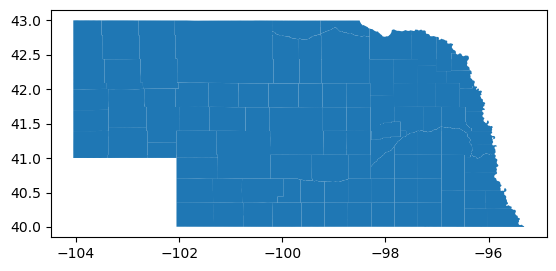

In [3]:
nebraska_counties.plot()

In [4]:
nebraska_counties.explore()

Using the default year of 2021
Using FIPS code '26' for input 'MI'
Using FIPS code '161' for input 'Washtenaw'


<AxesSubplot:>

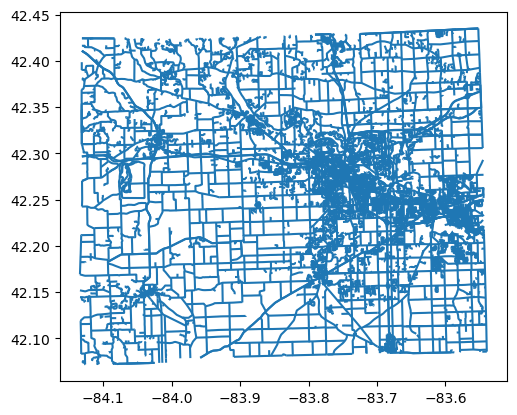

In [7]:
washtenaw_roads = pygris.roads(state = "MI", county = "Washtenaw")
washtenaw_roads.plot()

Using the default year of 2021
Using FIPS code '26' for input 'MI'
Using FIPS code '161' for input 'Washtenaw'


<AxesSubplot:>

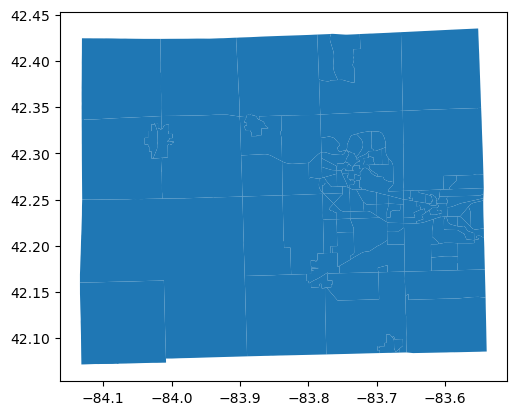

In [9]:
washtenaw_tracts = pygris.tracts(state = "MI", county = "Washtenaw")
washtenaw_tracts.plot()

While we have no tidycensus in python, we do have:
- cenpy: https://cenpy-devs.github.io/cenpy/api.html
- census: https://github.com/datamade/census
- censusData: https://jtleider.github.io/censusdata/
- censusdis: https://github.com/vengroff/censusdis

In pygris, we can also use the getcensus() function!


Using FIPS code '36' for input 'NY'
Using FIPS code '061' for input 'New York'
Using FIPS code '005' for input 'Bronx'
Using FIPS code '085' for input 'Richmond'
Using FIPS code '047' for input 'Kings'
Using FIPS code '081' for input 'Queens'


<AxesSubplot:>

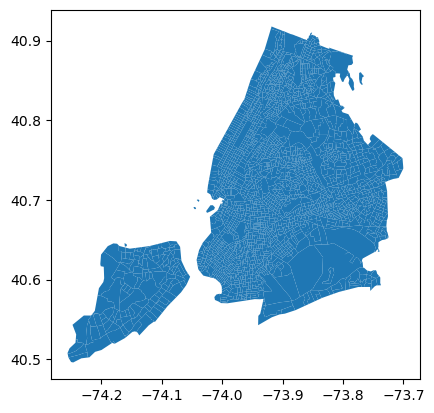

In [10]:
# Get NYC tracts
from pygris import tracts
nyc_counties = ["New York", "Bronx", "Richmond", 
                "Kings", "Queens"]
nyc_tracts = tracts(state = "NY", county = nyc_counties, cb = True,
                    year = 2021, cache = True)
nyc_tracts.plot()

In [37]:
# "The get_census() function is inspired by the censusapi R package, which can flexibly get data from any Census Bureau API endpoint"
?get_census 
# see details below for dataaset and variable options

Signature:
get_census(
    dataset,
    variables,
    year=None,
    params={},
    return_geoid=False,
    guess_dtypes=False,
)
Docstring:
Make a request to a US Census Bureau API endpoint

Parameters
--------------
dataset : str
    The dataset name; browse https://api.census.gov/data.html for options.
    The name will be the componet of the API URL that follows "data/" or 
    the year.  For example, 1-year ACS data will be "acs/acs1". 
variables : str or list
    A string (or list of strings) representing the variables requested from the 
    API. Datasets have 'variables.html' pages that can be viewed to find 
    variable IDs, e.g. "https://api.census.gov/data/2017/acs/acs1/variables.html". 
year : int
    The year of the dataset, e.g. 2021. Not all datasets use a year, so leave 
    blank if so (such as the timeseries APIs). 
params : dict
    A dict of parameters to send with your API request.  This will 
    vary based on the API you are using. You don't need to include
   

In [13]:
# Get NYC demographic data
from pygris.data import get_census
ny_college = get_census(dataset = "acs/acs5/profile", # dataset name on the Census API you are connecting to; find datasets at https://api.census.gov/data.html
                        variables = "DP02_0068PE", # string (or list of strings) of desired vars. For the 2021 5-year ACS Data Profile, those variable IDs are found at https://api.census.gov/data/2021/acs/acs5/profile/variables.html.
                        year = 2021, # year of your data (or end-year for a 5-year ACS sample)
                        params = { # dict of query parameters to send to the API.
                          "for": "tract:*",
                          "in": "state:36"},
                        guess_dtypes = True,
                        return_geoid = True)

<AxesSubplot:>

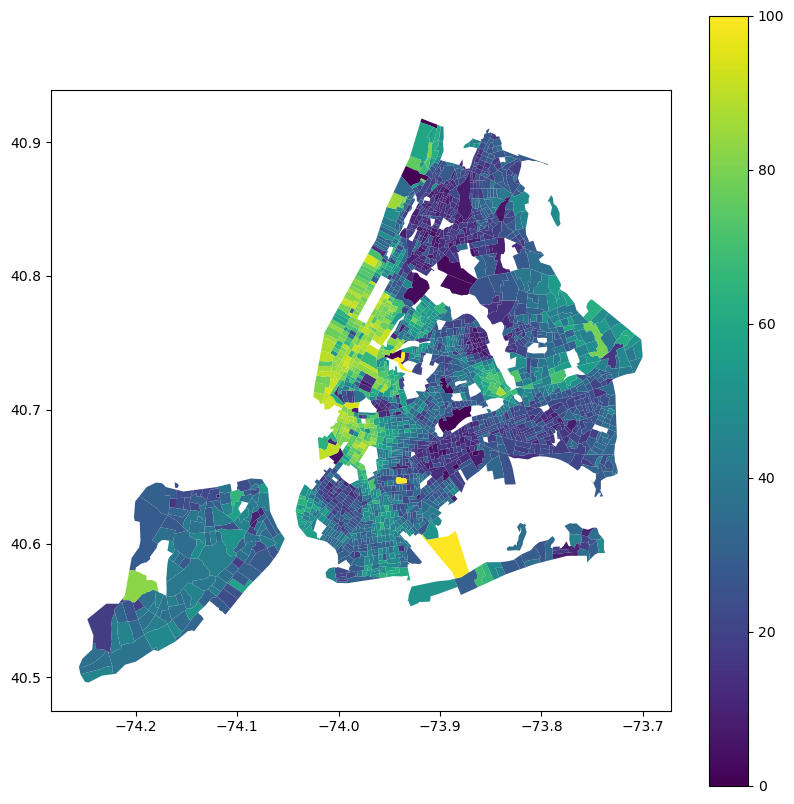

In [14]:
# Joining the data and mapping it
nyc_merged = nyc_tracts.merge(ny_college, how = "inner", on = "GEOID")
nyc_merged.plot(column = "DP02_0068PE", legend = True, figsize = (10, 10)) # believe plot() from gpd

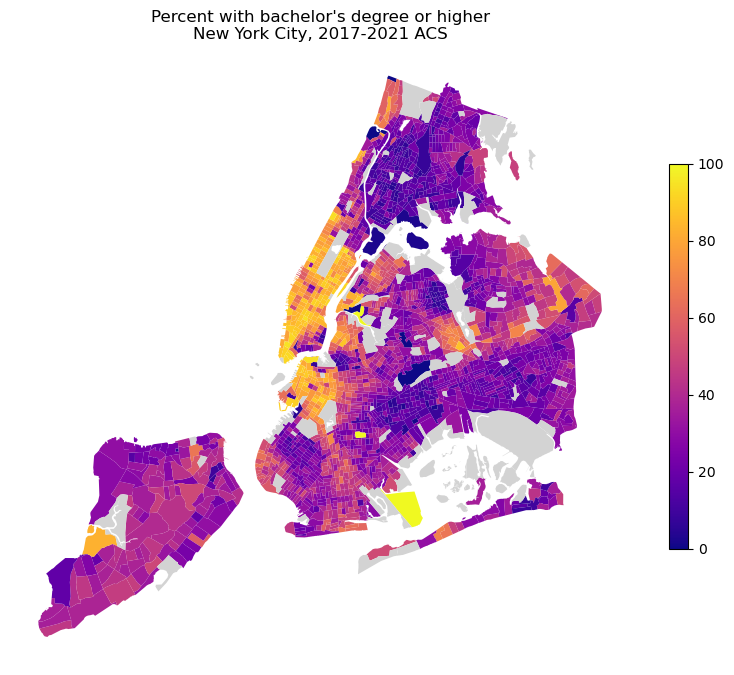

In [15]:
# Some map improvements
from pygris.utils import erase_water
import matplotlib.pyplot as plt
nyc_erase = erase_water(nyc_merged, area_threshold = 0.9)
nyc_erase.plot(column = "DP02_0068PE", legend = True,
               figsize = (10, 10), cmap = "plasma",
               legend_kwds = dict(shrink = 0.5),
               missing_kwds = dict(color = "lightgrey"))
plt.title("Percent with bachelor's degree or higher\nNew York City, 2017-2021 ACS")
ax = plt.gca()
ax.set_axis_off()

In [16]:
# A leaflet version
nyc_erase.explore(column = "DP02_0068PE")

In [17]:
# An improved leaflet
nyc_subset = nyc_erase.filter(["GEOID", "DP02_0068PE", "geometry"])
nyc_subset.explore(column = "DP02_0068PE", cmap = "plasma",
                   tooltip = False, popup = True,
                   tiles = "CartoDB positron",
                   style_kwds = dict(weight = 0.5, nan_fill_color = "lightgrey"),
                   popup_kwds = dict(aliases = ["Census tract", "Percent"]),
                   legend_kwds = dict(caption = "Percent age 25+ with bachelor's degree"))

In [41]:
ssdan_tracts = tracts(state = "MI", cb = True, 
                      subset_by = {"426 Thompson St, Ann Arbor MI 48106": 5000})
ssdan_tracts.explore()

Using the default year of 2021
Using FIPS code '26' for input 'MI'


In [29]:
# neat stuff here -- geocoding. note that census geocoding is on the street rather than rooftop so not too super accurate
from pygris.geocode import geocode
home = geocode("167 Hepburn Rd, Middlebury VT 05753", as_gdf = True) # as_gdf = true to return mappable dataframe with geom
home.explore(marker_type = "marker")

In [32]:
# selecting census geometries by radius around address
ssdan_tracts = tracts(state = "MI", cb = True, # brings in geometry of cartographic rather than state boundaries -- looks more like the state
                      subset_by = {"426 Thompson St, Ann Arbor MI 48106": 5000})
ssdan_tracts.explore()

Using the default year of 2021
Using FIPS code '26' for input 'MI'


More helpful information on pygris: https://walker-data.com/pygris/01-basic-usage/

Using the default year of 2021
Using FIPS code '26' for input 'MI'
Using the default year of 2021
Using FIPS code '26' for input 'MI'


Text(0.5, 1.0, 'Cartographic')

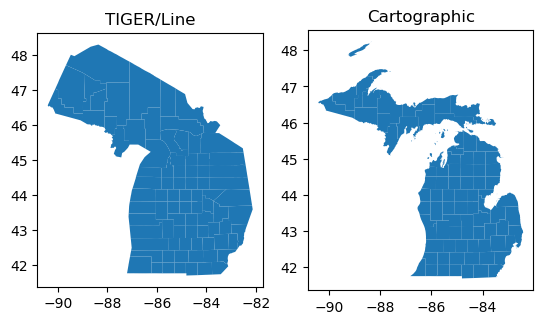

In [39]:
# illustration of TIGER/line vs cartographic
import matplotlib.pyplot as plt
from pygris import counties
# Get the default TIGER/Line file for counties in Michigan
mi_tiger = counties(state = "MI", cache = True)

# Get the cartographic boundary file with cb = True
mi_cartographic = counties(state = "MI", cb = True, cache = True)

# Plot the two side-by-side to compare them
fig, ax = plt.subplots(ncols = 2)
mi_tiger.plot(ax = ax[0])
mi_cartographic.plot(ax = ax[1])

ax[0].set_title("TIGER/Line")
ax[1].set_title("Cartographic")


In [40]:
?counties

Signature:
counties(
    state=None,
    cb=False,
    resolution='500k',
    year=None,
    cache=False,
    subset_by=None,
)
Docstring:
Load a counties shapefile into Python as a GeoDataFrame

Parameters
----------
state : str
    The state name, state abbreviation, or two-digit FIPS code of the desired state. 
    If None (the default), counties for the entire United States
    will be downloaded.  
cb : bool 
    If set to True, download a generalized (1:500k) cartographic boundary file.  
    Defaults to False (the regular TIGER/Line file).
resolution : str 
    The resolution of the cartographic boundary file; only applies if 
    the cb argument is set to True. The default is "500k"; options also
    include "5m" (1:5 million) and "20m" (1:20 million)    
year : int 
    The year of the TIGER/Line or cartographic boundary shapefile. If not specified,
    defaults to 2021.
cache : bool 
    If True, the function will download a Census shapefile to a cache directory 
    on the u

## CenPy:

Their github: https://github.com/cenpy-devs/cenpy

First, a quick example: https://nbviewer.org/github/cenpy-devs/cenpy/blob/master/notebooks/product-api.ipynb


In [1]:
import cenpy
from cenpy import products
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
chicago = products.ACS(2017).from_place('Chicago, IL', level='tract',
                                        variables=['B00002*', 'B01002H_001E'])

Matched: Chicago, IL to Chicago city within layer Incorporated Places


/var/folders/v0/bc8r6b2510994_w9c67brgzh0000gn/T/ipykernel_96451/2425741656.py:1: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  chicago = products.ACS(2017).from_place('Chicago, IL', level='tract',


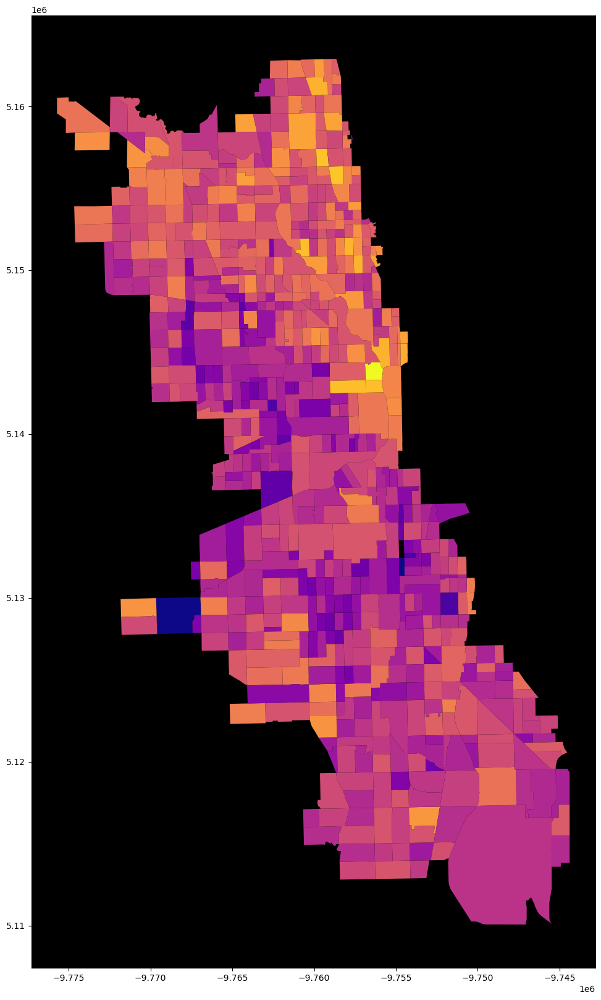

In [3]:
f, ax = plt.subplots(1,1,figsize=(20,20))
chicago.dropna(subset=['B00002_001E'], axis=0).plot('B00002_001E', ax=ax, cmap='plasma')
ax.set_facecolor('k')

https://nbviewer.org/github/cenpy-devs/cenpy/blob/master/notebooks/segregation.ipynb

In [5]:
# list all variables 
acs = cenpy.products.ACS()
acs.variables

,label,concept,predicateType,group,limit,predicateOnly,hasGeoCollectionSupport,attributes,required
AIANHH,Geography,NaN,NaN,N/A,0,NaN,NaN,NaN,NaN
AIHHTL,Geography,NaN,NaN,N/A,0,NaN,NaN,NaN,NaN
AIRES,Geography,NaN,NaN,N/A,0,NaN,NaN,NaN,NaN
ANRC,Geography,NaN,NaN,N/A,0,NaN,NaN,NaN,NaN
B01001A_001E,Estimate!!Total:,SEX BY AGE (WHITE ALONE),int,B01001A,0,NaN,NaN,"B01001A_001EA,B01001A_001M,B01001A_001MA",NaN
...,...,...,...,...,...,...,...,...,...
UA,Geography,NaN,NaN,N/A,0,NaN,NaN,NaN,NaN
ZCTA,Geography,NaN,NaN,N/A,0,NaN,NaN,NaN,NaN
for,Census API FIPS 'for' clause,Census API Geography Specification,fips-for,N/A,0,True,NaN,NaN,NaN
in,Census API FIPS 'in' clause,Census API Geography Specification,fips-in,N/A,0,True,NaN,NaN,NaN


In [6]:
# list all tables
acs.tables

,description,columns
table_name,,
B01001,SEX BY AGE,"[B01001_001E, B01001_002E, B01001_003E, B01001..."
B01002,MEDIAN AGE BY SEX,"[B01002_001E, B01002_002E, B01002_003E]"
B01003,TOTAL POPULATION,[B01003_001E]
B02001,RACE,"[B02001_001E, B02001_002E, B02001_003E, B02001..."
B02008,WHITE ALONE OR IN COMBINATION WITH ONE OR MORE...,[B02008_001E]
...,...,...
C27014,PUBLIC HEALTH INSURANCE BY WORK EXPERIENCE,"[C27014_001E, C27014_002E, C27014_003E, C27014..."
C27016,HEALTH INSURANCE COVERAGE STATUS BY RATIO OF I...,"[C27016_001E, C27016_002E, C27016_003E, C27016..."
C27017,PRIVATE HEALTH INSURANCE BY RATIO OF INCOME TO...,"[C27017_001E, C27017_002E, C27017_003E, C27017..."


In [7]:
# filter tables to make it much less to look at
acs.filter_tables('HISPANIC', by='description')

,description,columns
table_name,,
B03001,HISPANIC OR LATINO ORIGIN BY SPECIFIC ORIGIN,"[B03001_001E, B03001_002E, B03001_003E, B03001..."
B03002,HISPANIC OR LATINO ORIGIN BY RACE,"[B03002_001E, B03002_002E, B03002_003E, B03002..."
B03003,HISPANIC OR LATINO ORIGIN,"[B03003_001E, B03003_002E, B03003_003E]"
B16006,LANGUAGE SPOKEN AT HOME BY ABILITY TO SPEAK EN...,"[B16006_001E, B16006_002E, B16006_003E, B16006..."
B98013,TOTAL POPULATION COVERAGE RATE BY WEIGHTING RA...,"[B98013_001E, B98013_002E, B98013_003E, B98013..."
B99031,ALLOCATION OF HISPANIC OR LATINO ORIGIN,"[B99031_001E, B99031_002E, B99031_003E]"


In [8]:
# choosing table B03002, let's look at the vars in that table
acs.filter_variables('B03002')

,label,concept,predicateType,group,limit,predicateOnly,hasGeoCollectionSupport,attributes,required
B03002_021E,Estimate!!Total:!!Hispanic or Latino:!!Two or ...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_021EA,B03002_021M,B03002_021MA",NaN
B03002_020E,Estimate!!Total:!!Hispanic or Latino:!!Two or ...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_020EA,B03002_020M,B03002_020MA",NaN
B03002_001E,Estimate!!Total:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_001EA,B03002_001M,B03002_001MA",NaN
B03002_005E,Estimate!!Total:!!Not Hispanic or Latino:!!Ame...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_005EA,B03002_005M,B03002_005MA",NaN
B03002_004E,Estimate!!Total:!!Not Hispanic or Latino:!!Bla...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_004EA,B03002_004M,B03002_004MA",NaN
B03002_003E,Estimate!!Total:!!Not Hispanic or Latino:!!Whi...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_003EA,B03002_003M,B03002_003MA",NaN
B03002_002E,Estimate!!Total:!!Not Hispanic or Latino:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_002EA,B03002_002M,B03002_002MA",NaN
B03002_009E,Estimate!!Total:!!Not Hispanic or Latino:!!Two...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_009EA,B03002_009M,B03002_009MA",NaN
B03002_007E,Estimate!!Total:!!Not Hispanic or Latino:!!Nat...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_007EA,B03002_007M,B03002_007MA",NaN
B03002_008E,Estimate!!Total:!!Not Hispanic or Latino:!!Som...,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,NaN,"B03002_008EA,B03002_008M,B03002_008MA",NaN
